In [1]:
import time
import os
import cv2
import numpy as np
import pandas as pd
import math
import pylab as plt
from astropy.io import fits
from scipy.signal import convolve2d

In [3]:
folder = 'C:/Users/Tiger/Desktop/Capstone/Harvard_Data'
os.chdir(folder)

In [97]:
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    return np.where(sd == 0, 0, m/sd)

In [4]:
def estimate_noise(I):

  H, W = I.shape
  M = [[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]]

  sigma = np.sum(np.sum(np.absolute(convolve2d(I, M))))
  sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))

  return sigma

In [160]:
%%time
snr = []
noise = []
stds = []

for names in fnames:
    fits_raw = fits.open(names)
    img_raw = fits_raw[0]
    img = img_raw.data[0,0,:,:] 
    img[np.isnan(img)] = 0
    img = img + abs(np.min(img))
    img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    
    snr.append(signaltonoise(img, axis = None))
    noise.append(estimate_noise(img))
    stds.append(img.std())

Wall time: 7.78 s


In [154]:
res = pd.DataFrame(zip(fnames_trim, noise, stds, snr), columns = (['names', 'noise', 'stds', 'snr']))
res.head()

,names,noise,stds,snr
0,HH111mms_cont_robust0.5.pbcor.fits,0.163812,5.588998,1.1423182120535977
1,HH111mms_cont_robust2.pbcor.fits,0.102699,5.986488,0.884568449406042
2,HH212mms_cont_robust0.5.pbcor.fits,0.196881,3.592756,1.7409065145639944
3,HH212mms_cont_robust2.pbcor.fits,0.126569,3.795856,1.376694510909314
4,HH270mms1_cont_robust0.5.pbcor.fits,0.185488,4.042017,1.3541323145928446


In [85]:
def opencv_blob(filename, minThreshold = 1000, minArea = 1/10, maxArea = 1/72, minCircularity = 0.1):
    
    fits_raw = fits.open(filename)
    img_raw = fits_raw[0]
    img = img_raw.data[0,0,:,:] 
    img[np.isnan(img)] = 0
    img = img + abs(np.min(img))
    
    img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    
    noise = estimate_noise(img)
    
    params = cv2.SimpleBlobDetector_Params()
    
    threshold = img.mean() + noise**2*minThreshold
    
    if threshold > 230:
        params.minThreshold = 230
    else:
        params.minThreshold = threshold

    #params.thresholdStep = 10
    params.maxThreshold = 250
    params.filterByArea = True
    params.minArea = img.shape[0] * minArea * noise
    params.maxArea = img.shape[0] * img.std()**2 * maxArea
    params.filterByCircularity = True
    params.minCircularity = minCircularity
    params.filterByInertia = False
    params.filterByConvexity = False
    params.filterByColor = True
    params.blobColor = 255
    #params.minRepeatability = 2
    #params.minDistBetweenBlobs = 10
    
    detector = cv2.SimpleBlobDetector_create(params)

    keypoints = detector.detect(img)
    
    return len(keypoints), keypoints, img

In [86]:
fnames = []
for entry in os.scandir(folder):
    if entry.path.endswith(".fits"):
        fnames.append(entry.path)

In [87]:
fnames[0]

'C:/Users/Tiger/Desktop/Capstone/Harvard_Data\\HH111mms_cont_robust0.5.pbcor.fits'

In [88]:
%%time
blobs = []
for names in fnames:
    count, keys, img= opencv_blob(names)
    blobs.append(count)

Wall time: 7.44 s


In [89]:
fnames_trim = []
for names in fnames:
    fnames_trim.append(names.replace('C:/Users/Tiger/Desktop/Capstone/Harvard_Data\\', ''))

In [90]:
output = pd.DataFrame(zip(fnames_trim, blobs), columns = ['names', 'blobs_count'])
output.head()

,names,blobs_count
0,HH111mms_cont_robust0.5.pbcor.fits,2
1,HH111mms_cont_robust2.pbcor.fits,2
2,HH212mms_cont_robust0.5.pbcor.fits,1
3,HH212mms_cont_robust2.pbcor.fits,1
4,HH270mms1_cont_robust0.5.pbcor.fits,1


In [72]:
output.to_csv('output_opencv_test2.csv', index = False)

In [91]:
def drawKeyPts(im,keyp,col,th):
    for curKey in keyp:
        x=np.int(curKey.pt[0])
        y=np.int(curKey.pt[1])
        size = np.int(curKey.size*1.5)
        cv2.circle(im,(x,y),size, col,thickness=th, lineType=8, shift=0) 
    plt.figure(figsize = (6, 6))
    plt.imshow(im)  
    plt.show()  
    return None

In [92]:
def compare(fname):
    count, keys, img = opencv_blob(fname)
    
    print("Counted %d" % count)
    print(fname.replace('C:/Users/Tiger/Desktop/Capstone/Harvard_Data\\', ''))
    
    plt.figure(figsize = (6, 6))
    plt.imshow(img)  
    plt.show() 

    drawKeyPts(img, keys, (255, 0, 255), 5)

In [93]:
#HH270mms1_cont_robust2.pbcor.fits

Counted 2
HH111mms_cont_robust0.5.pbcor.fits


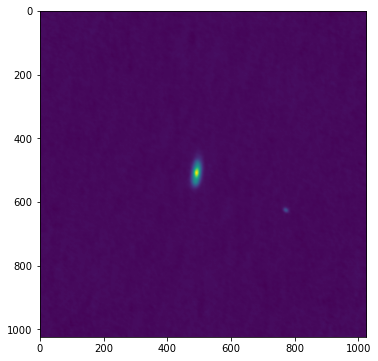

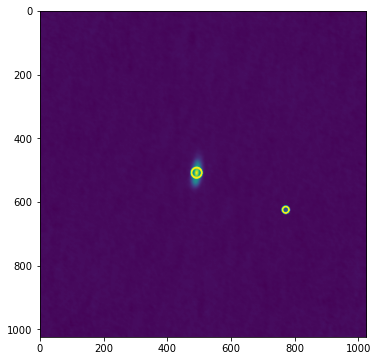

Counted 2
HH111mms_cont_robust2.pbcor.fits


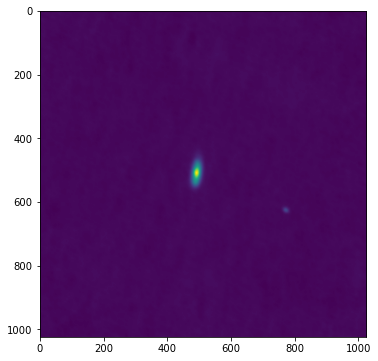

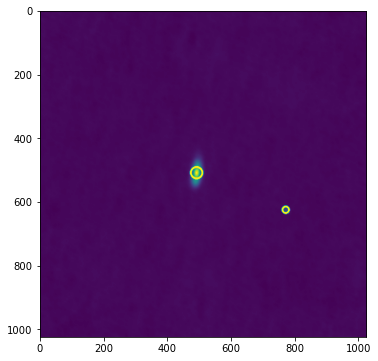

Counted 1
HH212mms_cont_robust0.5.pbcor.fits


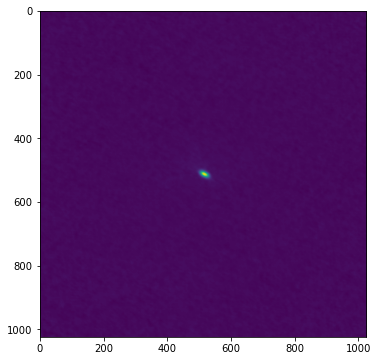

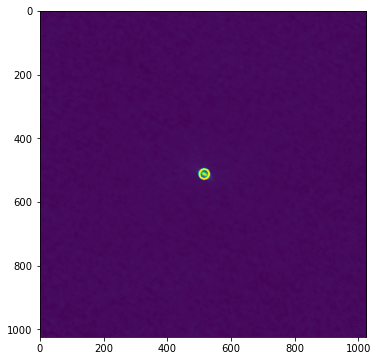

Counted 1
HH212mms_cont_robust2.pbcor.fits


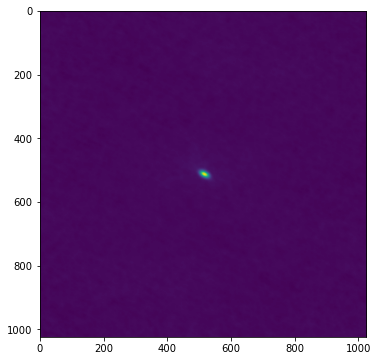

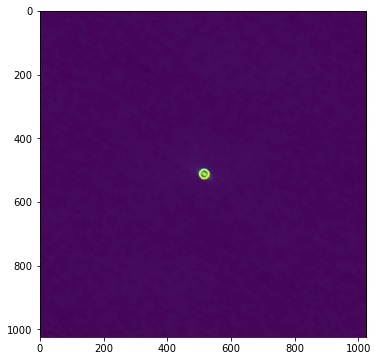

Counted 1
HH270mms1_cont_robust0.5.pbcor.fits


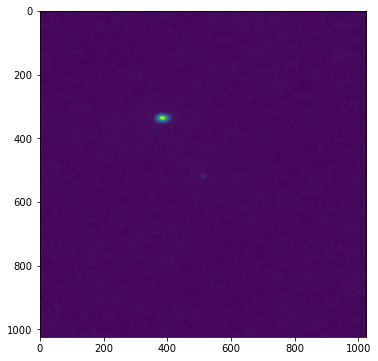

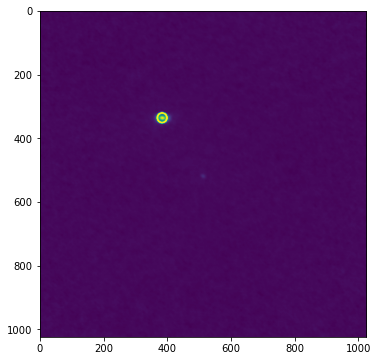

Counted 1
HH270mms1_cont_robust2.pbcor.fits


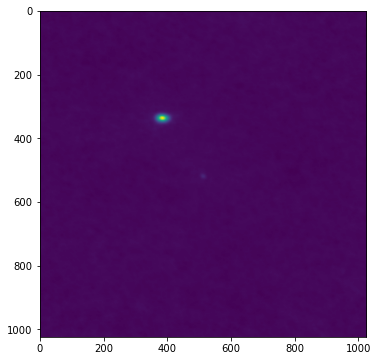

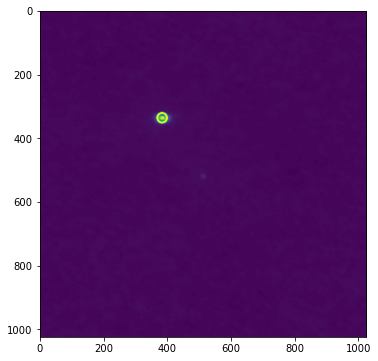

Counted 1
HH270mms2_cont_robust0.5.pbcor.fits


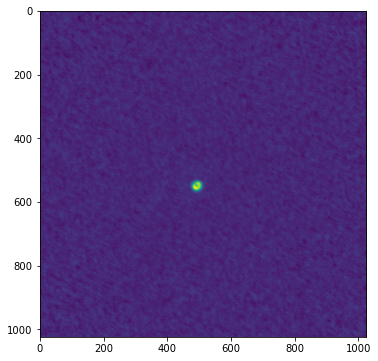

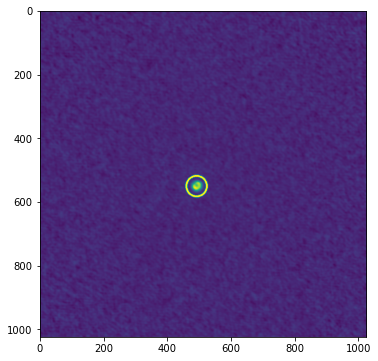

Counted 1
HH270mms2_cont_robust2.pbcor.fits


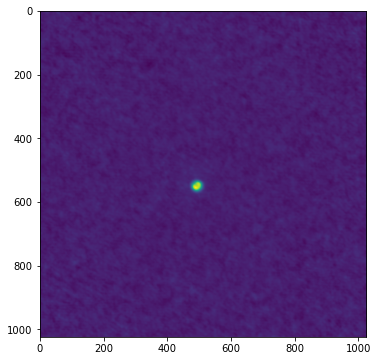

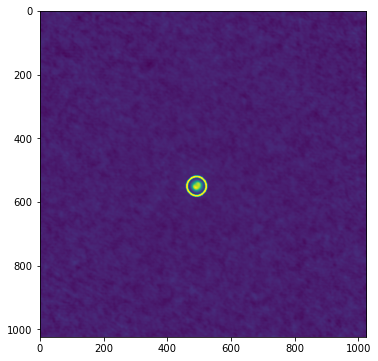

Counted 2
HH270VLA1_cont_robust0.5.pbcor.fits


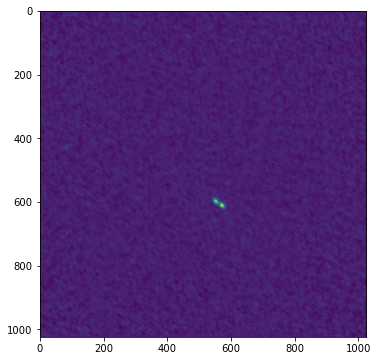

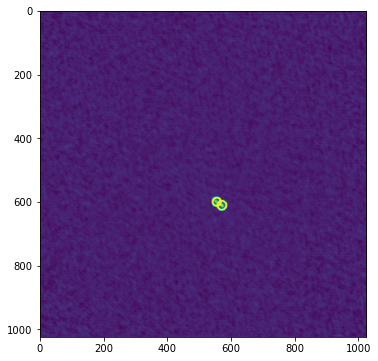

Counted 2
HH270VLA1_cont_robust2.pbcor.fits


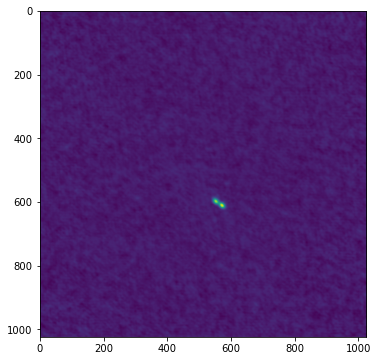

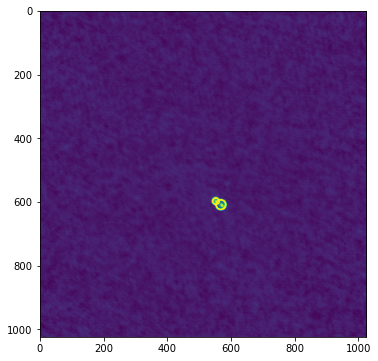

Counted 0
HOPS-100_cont_robust2.pbcor.fits


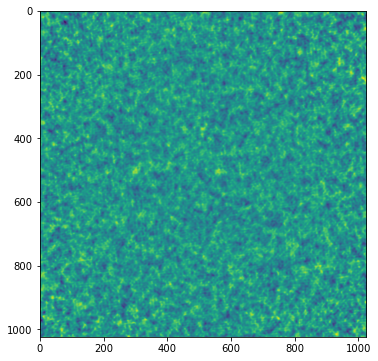

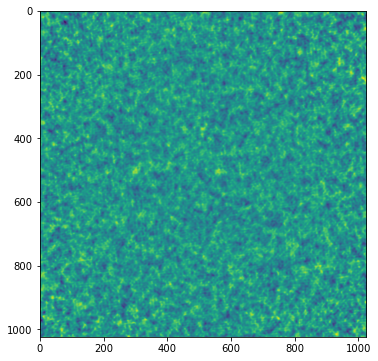

Counted 1
HOPS-102_cont_robust0.5.pbcor.fits


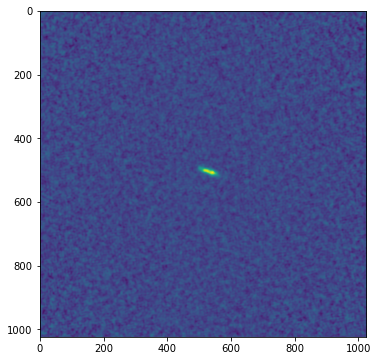

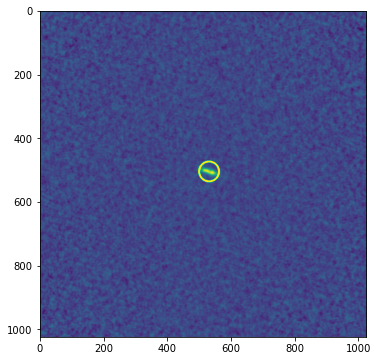

Counted 1
HOPS-102_cont_robust2.pbcor.fits


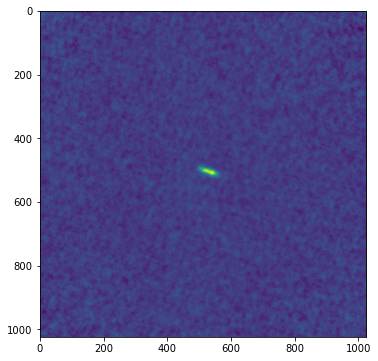

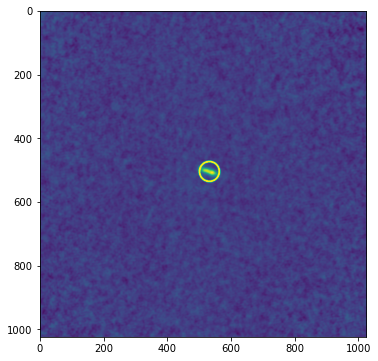

Counted 1
HOPS-105_cont_robust2.pbcor.fits


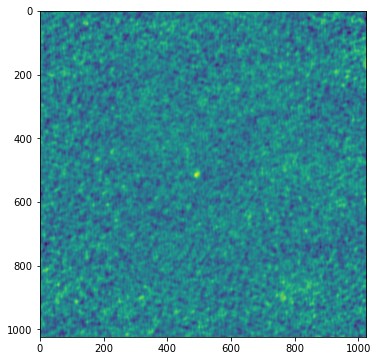

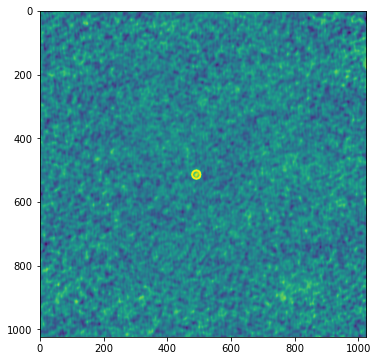

Counted 1
HOPS-107_cont_robust0.5.pbcor.fits


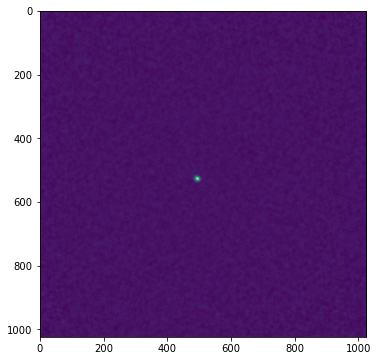

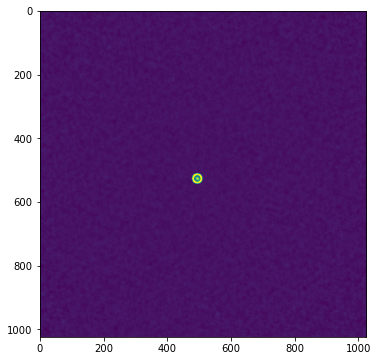

Counted 1
HOPS-107_cont_robust2.pbcor.fits


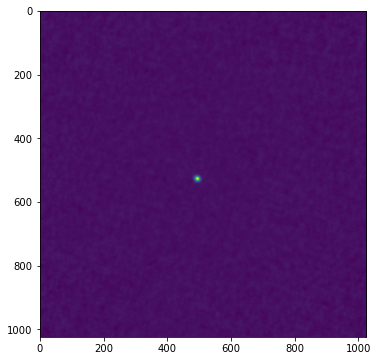

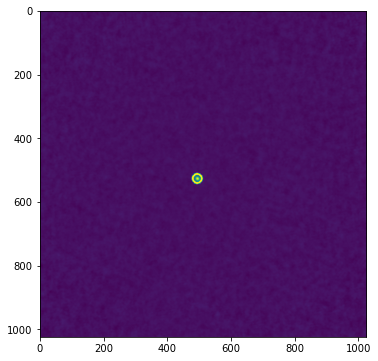

Counted 3
HOPS-108_cont_robust0.5.pbcor.fits


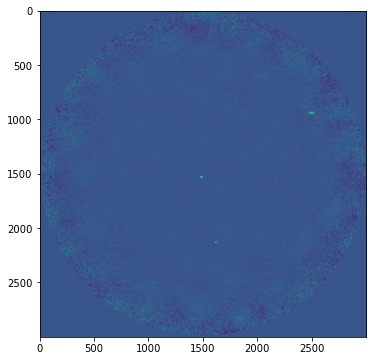

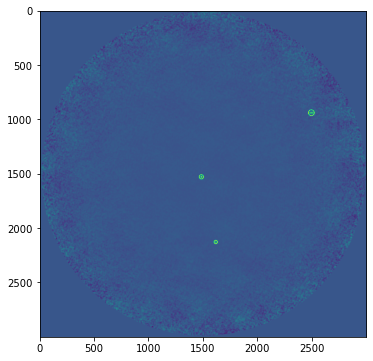

Counted 4
HOPS-108_cont_robust2.pbcor.fits


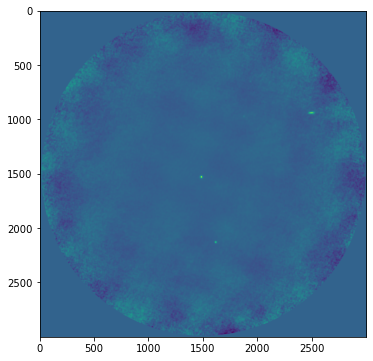

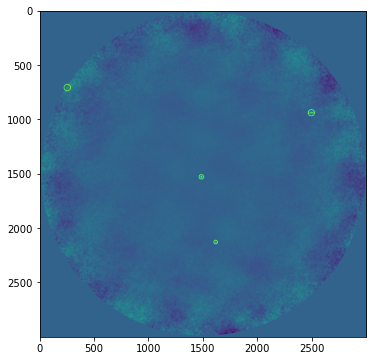

Counted 1
HOPS-10_cont_robust0.5.pbcor.fits


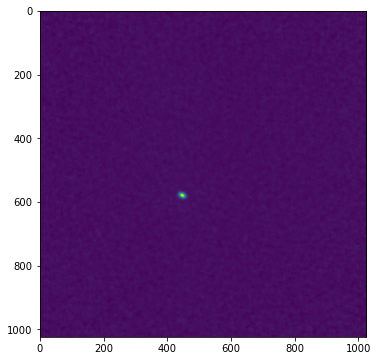

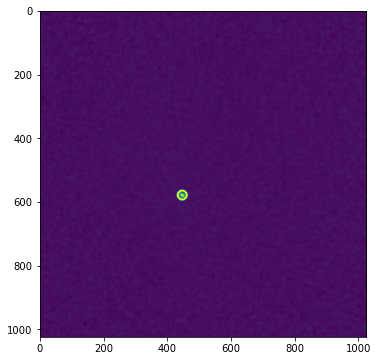

Counted 1
HOPS-10_cont_robust2.pbcor.fits


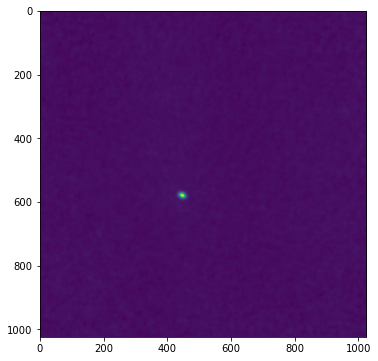

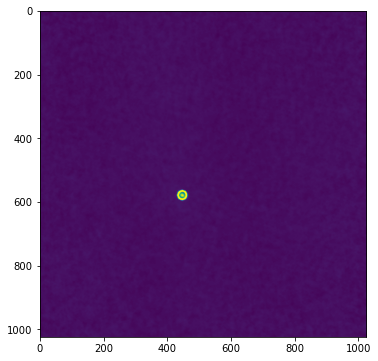

Counted 1
HOPS-114_cont_robust0.5.pbcor.fits


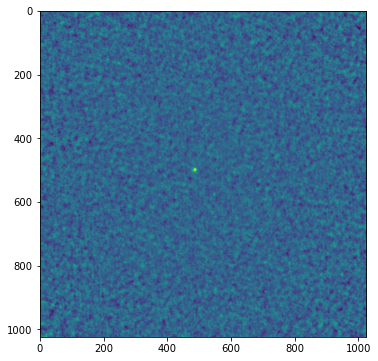

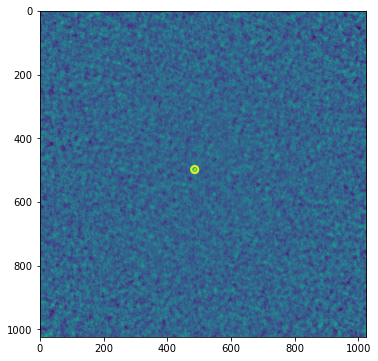

Counted 1
HOPS-114_cont_robust2.pbcor.fits


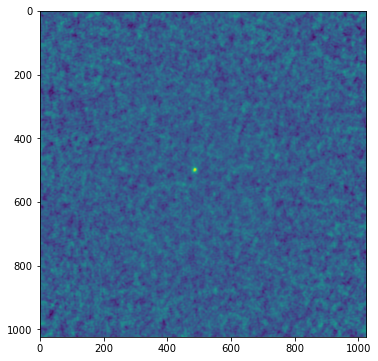

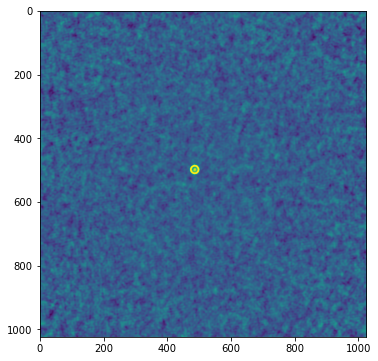

Counted 1
HOPS-115_cont_robust0.5.pbcor.fits


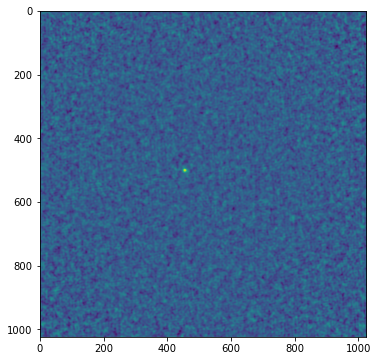

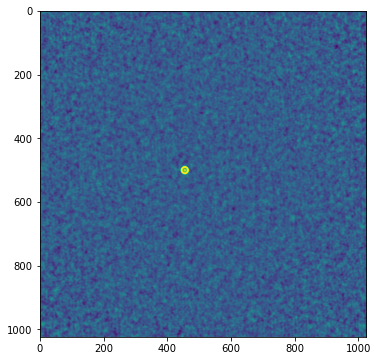

Counted 1
HOPS-115_cont_robust2.pbcor.fits


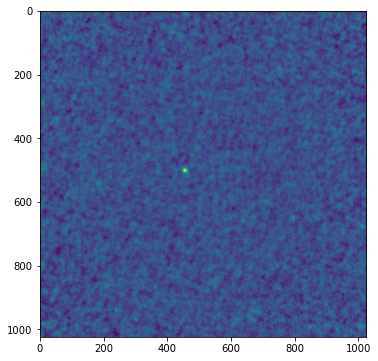

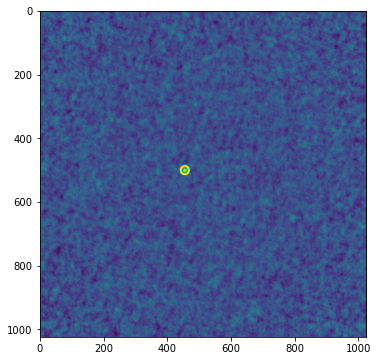

Counted 1
HOPS-116_cont_robust0.5.pbcor.fits


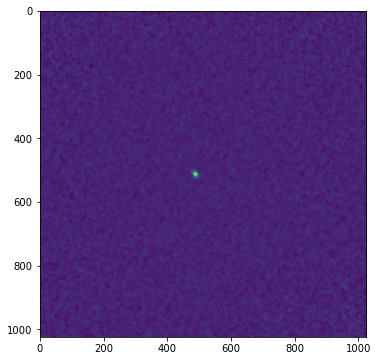

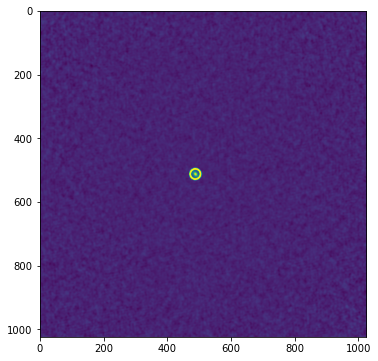

Counted 1
HOPS-116_cont_robust2.pbcor.fits


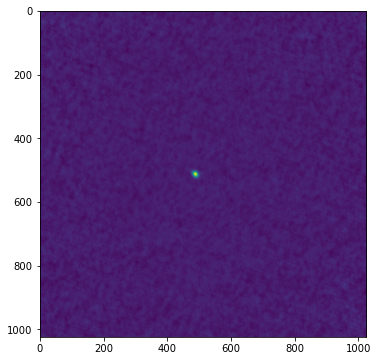

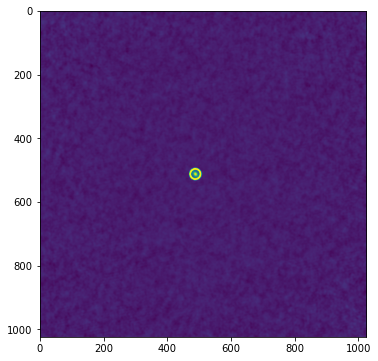

Counted 1
HOPS-117_cont_robust0.5.pbcor.fits


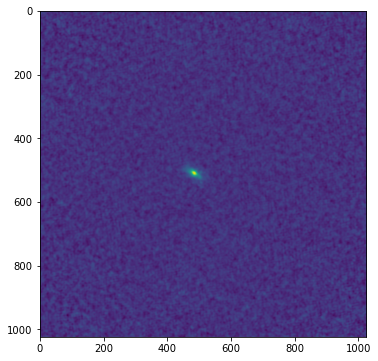

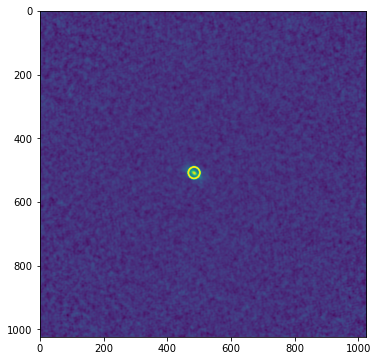

Counted 1
HOPS-117_cont_robust2.pbcor.fits


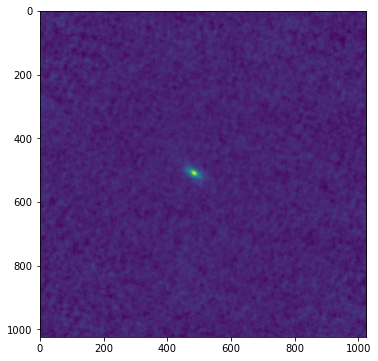

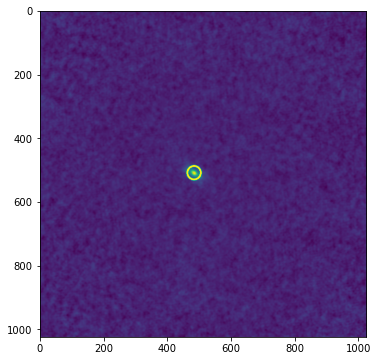

Counted 1
HOPS-118_cont_robust2.pbcor.fits


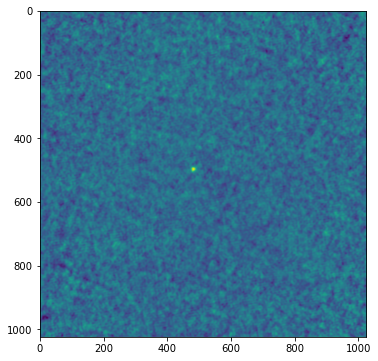

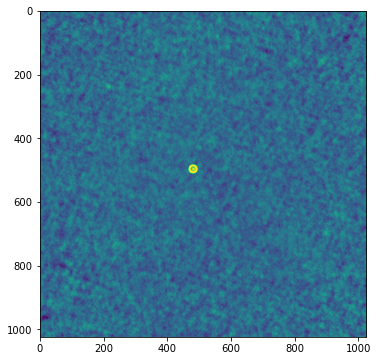

Counted 2
HOPS-119_cont_robust2.pbcor.fits


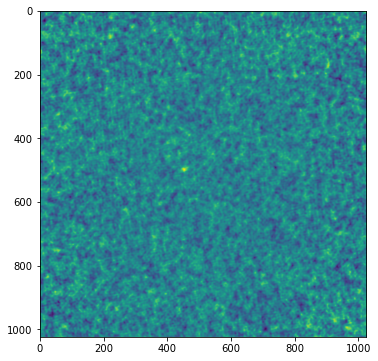

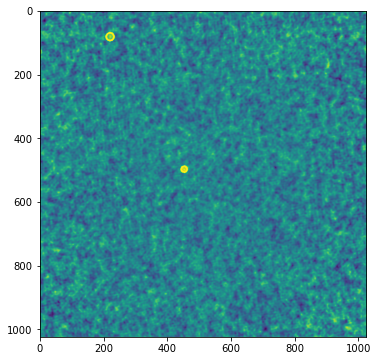

Counted 1
HOPS-11_cont_robust0.5.pbcor.fits


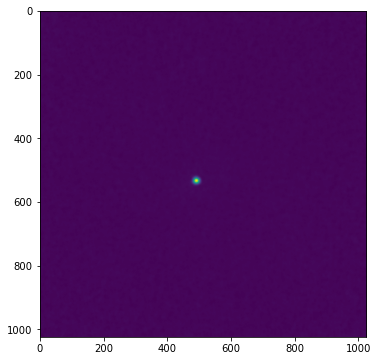

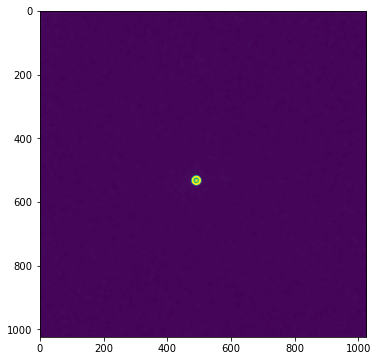

Counted 1
HOPS-11_cont_robust2.pbcor.fits


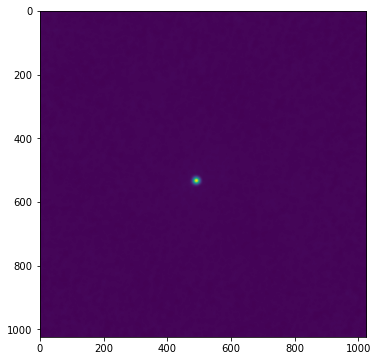

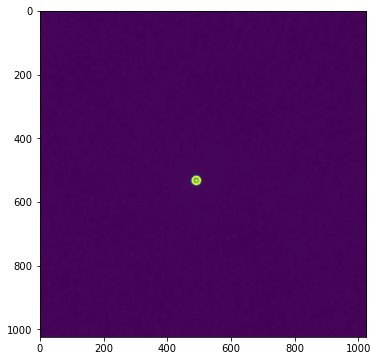

Counted 1
HOPS-120_cont_robust2.pbcor.fits


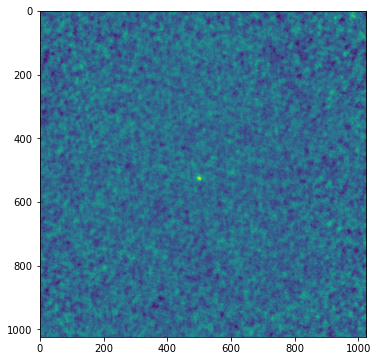

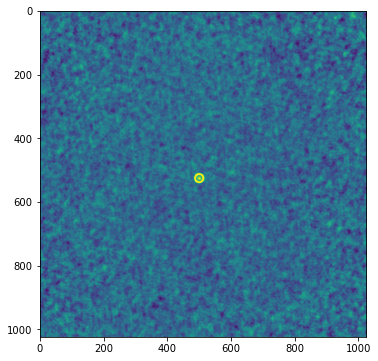

Counted 1
HOPS-121_cont_robust0.5.pbcor.fits


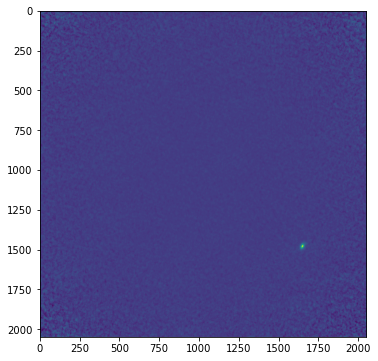

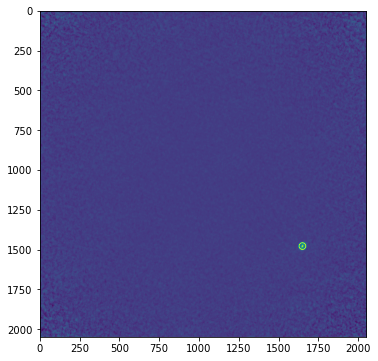

Counted 1
HOPS-121_cont_robust2.pbcor.fits


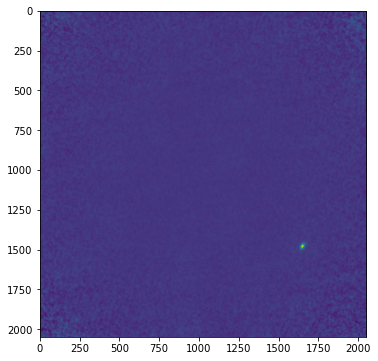

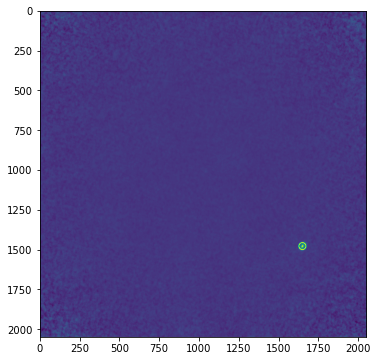

Counted 1
HOPS-122_cont_robust0.5.pbcor.fits


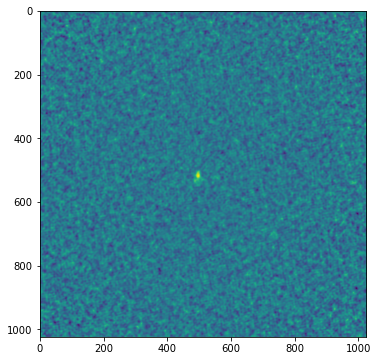

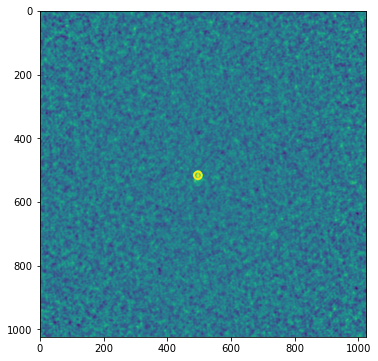

Counted 1
HOPS-122_cont_robust2.pbcor.fits


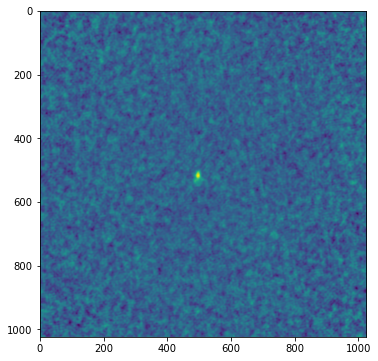

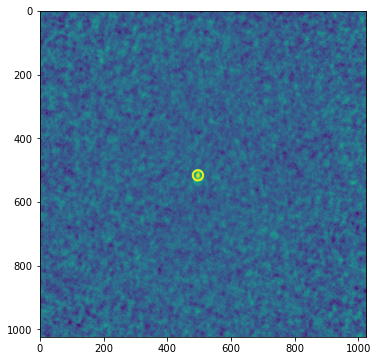

Counted 1
HOPS-123_cont_robust0.5.pbcor.fits


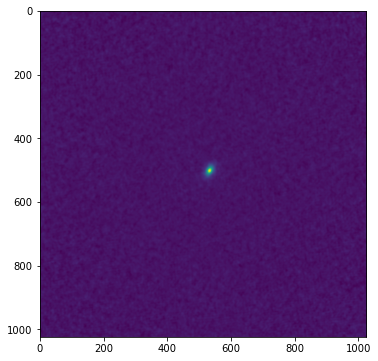

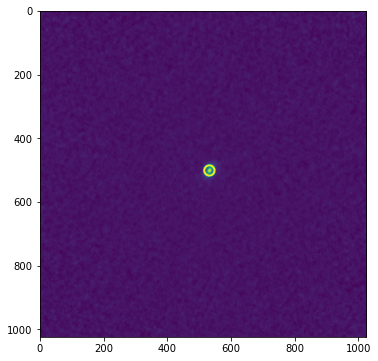

Counted 1
HOPS-123_cont_robust2.pbcor.fits


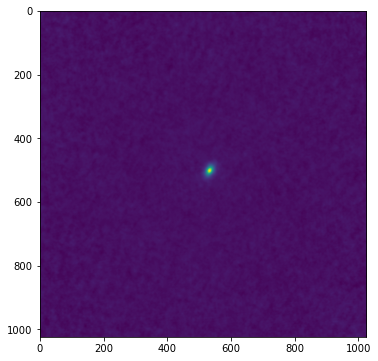

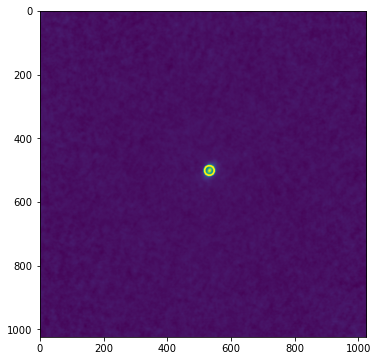

Counted 1
HOPS-124_cont_robust0.5.pbcor.fits


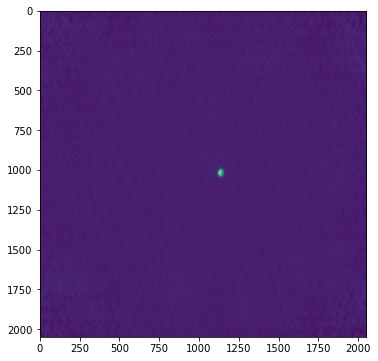

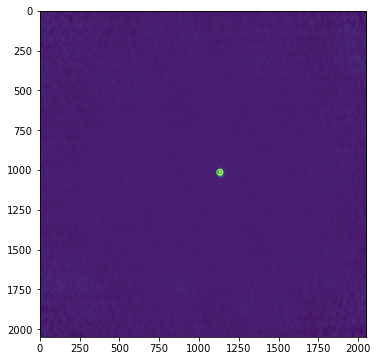

Counted 1
HOPS-124_cont_robust2.pbcor.fits


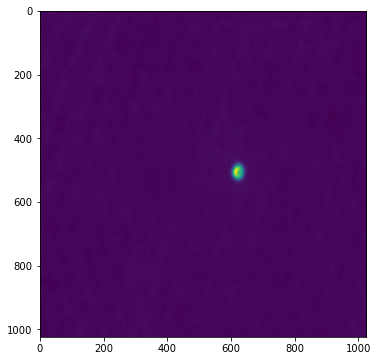

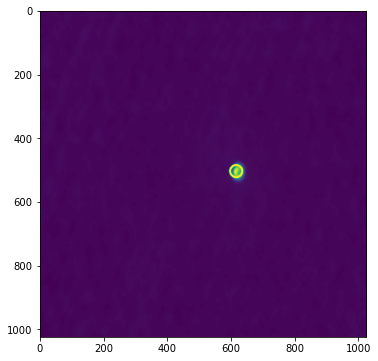

Counted 1
HOPS-125_cont_robust0.5.pbcor.fits


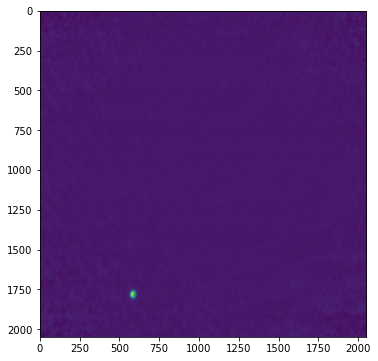

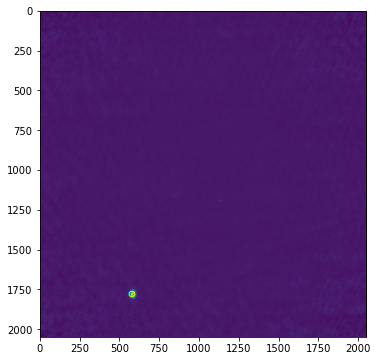

Counted 1
HOPS-125_cont_robust2.pbcor.fits


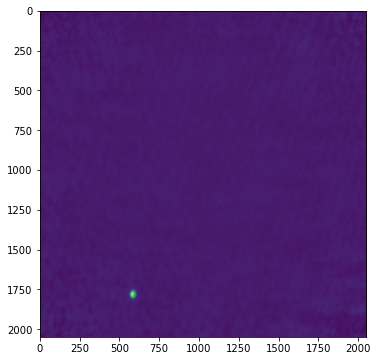

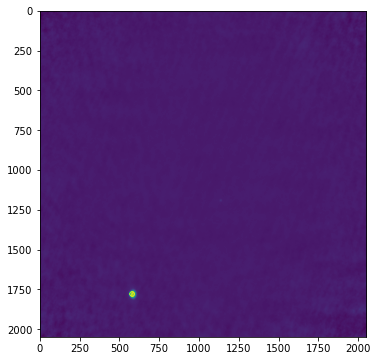

Counted 1
HOPS-127_cont_robust0.5.pbcor.fits


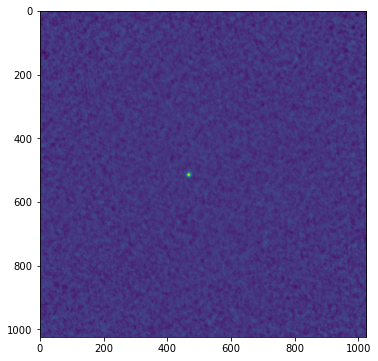

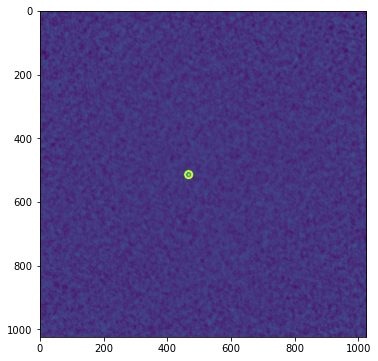

Counted 1
HOPS-127_cont_robust2.pbcor.fits


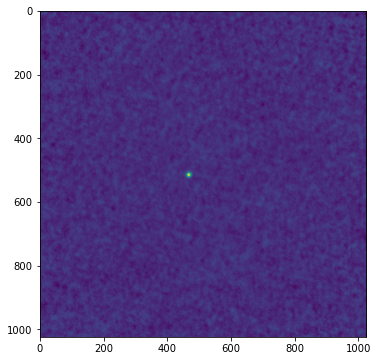

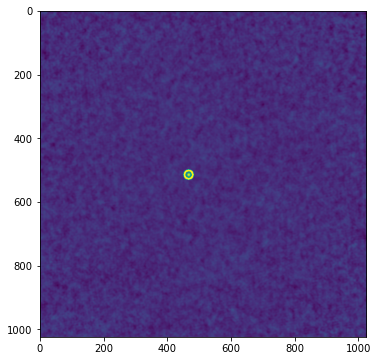

Counted 1
HOPS-128_cont_robust0.5.pbcor.fits


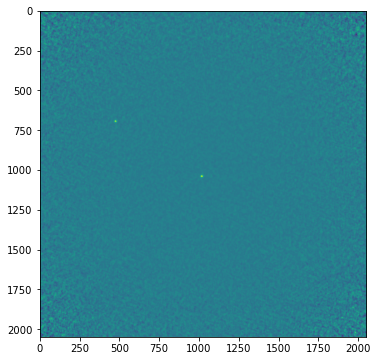

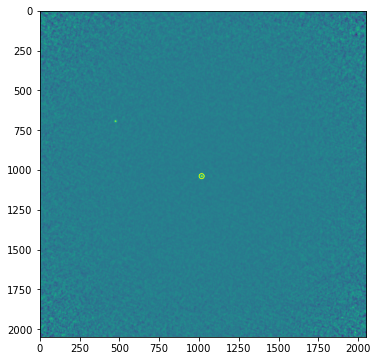

Counted 2
HOPS-128_cont_robust2.pbcor.fits


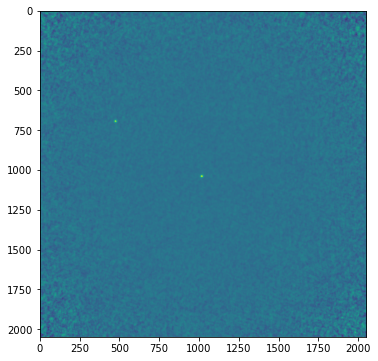

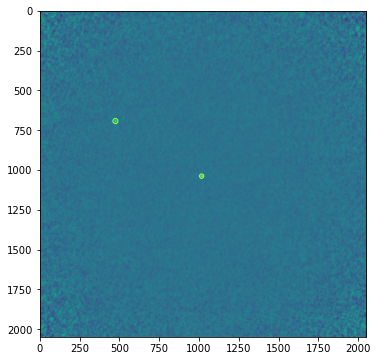

Counted 1
HOPS-129_cont_robust0.5.pbcor.fits


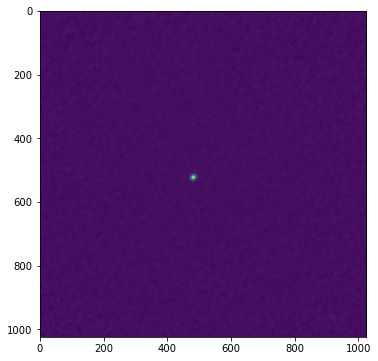

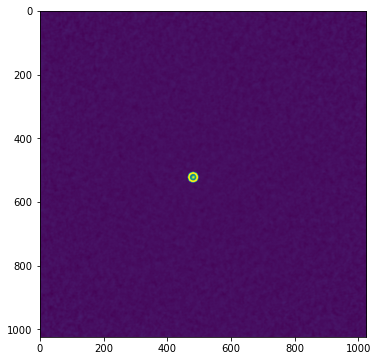

Counted 1
HOPS-129_cont_robust2.pbcor.fits


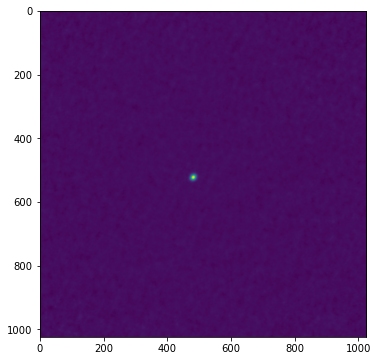

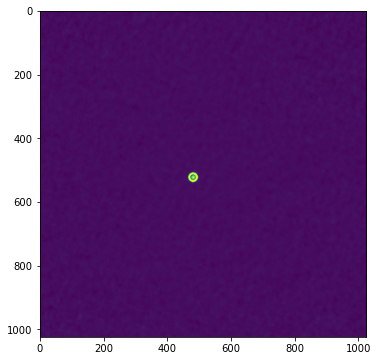

Counted 3
HOPS-12_cont_robust0.5.pbcor.fits


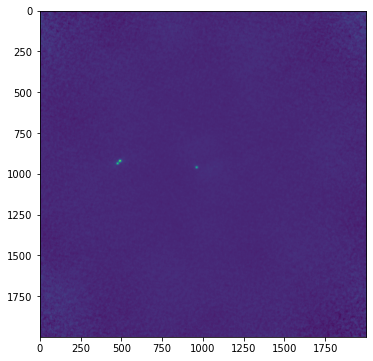

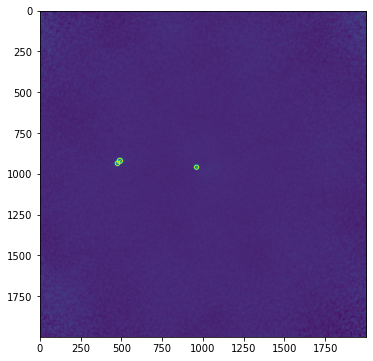

In [94]:
for names in fnames:
    compare(names)